In [ ]:
#breaking each dataset into different excel files
import os
import lasio
file = 1 # file number
f = open('well-'+str(file)+'.LAS')
f2 = open('well-'+str(file)+'-modified.LAS', 'a+')
isHeader = False
i = 0
for line in f.readlines():
    if line == '~Parameter Information Block\n':
        print("YES")
        i += 1
        f2.close()
        f2 = open('well-'+str(file)+'-modified-'+str(i)+'.LAS', 'a+')
    f2.write(line)
f2.close()
  
    
while i > 0:
    las = lasio.read('well-'+str(file)+'-modified-'+str(i)+'.LAS')
    las.df().to_excel('well-'+str(file)+'-modified-'+str(i)+'.xlsx')
    #os.remove('well-'+str(file)+'-modified-'+str(i)+'.LAS')
    i -= 1
#os.remove('well-'+str(file)+'-modified.LAS')

In [ ]:
#removing extra lines
file = open("well-1.LAS", 'r')
start = False
end = True
for i in file.readlines():
    #print()
    i=i[:-1] # ---deletion of extra blank lines
    if ("~A" in i and (start == False)):
        start = True
        end = False
        continue
    if("~" in i and (start == True)):
        start = False 
        end = True
    if((start == True) and (end == False)):
        print(i)

In [ ]:
#original 
file = open("well-1.LAS", 'r')
start = False
end = True
for i in file.readlines():
    #print()
    if ("~A" in i and (start == False)):
        start = True
        end = False
        continue
    if("~" in i and (start == True)):
        start = False 
        end = True
    if((start == True) and (end == False)):
        print(i)

In [ ]:
#headers/attributes added
file = open("well-1.LAS", 'r')
start = False
end = True
for i in file.readlines():
    #print()
    #i=i[:-1]
    if ("~A" in i and (start == False)):
        start = True
        end = False
    elif("~" in i and (start == True)):
        start = False 
        end = True
    if((start == True) and (end == False)):
        a=i.strip()
        a1=a.replace("~A", "")
        print(a1)

In [ ]:
#converting to integer and list
file = open("well-1.LAS", 'r')
start = False
end = True
for i in file.readlines():
    #print()
    #i=i[:-1]
    if ("~A" in i and (start == False)):
        start = True
        end = False
    elif("~" in i and (start == True)):
        start = False 
        end = True
    if((start == True) and (end == False)):
        a=i.strip()
        if ("~A" in a):
            a=a.replace("~A", "")
            a1=a.split()
        else :
            a=a.split()
            a1=[eval(i) for i in a]
        print(a1)

In [ ]:
import pandas as pd
import numpy as np
file = open("well-1.LAS", 'r')
start = False
end = True
dt = {}
k = False
for i in file.readlines():
    #print()
    #i=i[:-1]
    if ("~A" in i and (start == False)):
        start = True
        end = False
    elif("~" in i and (start == True)):
        start = False 
        end = True
        if k == True:
            dt[temp] = lt
            temp = 0  
        
    if((start == True) and (end == False)):
        a = i.strip()
        if ("~A" in a):
            a = a.replace("~A", "")
            a1 = a.split()   
            temp = a1[1]
            lt = []
            k = True
            #list = list.append(a)
        else :
            a = a.split()
            a1 = [eval(i) for i in a] 
            #print(a1)
            lt.append(a1)
            #print(lt)
        
print(dt)
            

In [ ]:
#modified
import pandas as pd
import numpy as np
file = open("well-1.LAS", 'r')
start = False
end = True
dt = {}
#lt = []
k = False
for i in file.readlines():
    #print()
    #i=i[:-1]
    if ("~A" in i and (start == False)):
        start = True
        end = False
    elif("~" in i and (start == True)):
        start = False 
        end = True
        if k == True:
            a = i.strip()
            a1 = a.split()
            if(len(a1)>2):
                for j in range(1,len(a1)):
                    lt = [a1[0], a1[j]]
                    dt[a1[j]].append(lt)
            else:
                lt = [a1[0], a1[1]]
                dt[a1[1]].append(lt)
            #dt[temp] = lt
            #temp = 0  
        
    if((start == True) and (end == False)):
        a = i.strip()
        if ("~A" in a):
            a = a.replace("~A", "")
            a1 = a.split()   
            #temp = a1[1]
            for j in range(1,len(a1)):
                dt[a1[j]] = []
            k = True
            lt = []
            #list = list.append(a)
        else :
            a = a.split()
            a1 = [eval(i) for i in a] 
            #print(a1)
            if(len(a1)>2):
                for j in range(1,len(a1)):
                    lt.extend([a1[0], a1[j]])
                    #lt = [a1[0], a1[j]]
                    #dt[a1[j]].append(lt)
            else:
                lt.append(a1)
            #print(lt)
        
print(dt)
            

In [ ]:
print(dt.keys())

In [ ]:
print(dt['LLD'])
DataFrame=pd.dataframe()

In [ ]:
print(dt['RHOB'])

In [ ]:
df = pd.DataFrame(data=dt)

In [ ]:
#FINAL code including a single file
import pandas as pd
import numpy as np
files = ["well-1.LAS"]
Dict = {}
List = []
flag = 0
for filename in files:
    #Dict["well Number"] = {filename:[]}
    Dict[filename] = {}
    file = open(filename, 'r')
    for line in file.readlines():
        if("~A" in line and flag == 0):
            head = line.strip()
            head = head.replace("~A", "")
            head = head.split()
            flag = 1
            for i in range(1, len(head), 1):
                Dict[filename][head[i]]=[]
        elif(flag == 1):
            if("~" in line):
                flag = 0
            else:
                data = line.strip()
                data = data.split()
                if(len(head)>2):
                    for i in range(1, len(head), 1):
                        List = [data[0], data[i]]
                        Dict[filename][head[i]].append(List)
                else:
                    Dict[filename][head[1]].append(data)
                    
print(Dict.keys())
print(Dict) 
    


In [1]:
#1  *FINAL code including all well files*
import pandas as pd
import numpy as np
files = ["well-1.LAS","well-2.LAS","well-3.LAS","well-4.LAS","well-5.LAS"]
Dict = {}
List = []
flag = 0
for filename in files:
    #Dict["well Number"] = {filename:[]}
    Dict[filename] = {}
    file = open(filename, 'r')
    for line in file.readlines():
        if("~A" in line and flag == 0):
            head = line.strip()
            head = head.replace("~A", "")
            head = head.split()
            flag = 1
            for i in range(1, len(head), 1):
                Dict[filename][head[i]]=[]
        elif(flag == 1):
            if("~" in line):
                flag = 0
            else:
                data = line.strip()
                data = data.split()
                if(len(head)>2):
                    for i in range(1, len(head), 1):
                        List = [data[0], data[i]]
                        Dict[filename][head[i]].append(List)
                else:
                    Dict[filename][head[1]].append(data)
                    
print(Dict.keys())
print(Dict) 
    


dict_keys(['well-1.LAS', 'well-2.LAS', 'well-3.LAS', 'well-4.LAS', 'well-5.LAS'])
{'well-1.LAS': {'DT': [['1428.9023', '56.9000'], ['1429.0547', '57.0000'], ['1429.2071', '56.9000'], ['1429.3595', '56.7000'], ['1429.5119', '56.9000'], ['1429.6643', '56.5000'], ['1429.8167', '56.8000'], ['1429.9691', '56.8000'], ['1430.1215', '56.8000'], ['1430.2739', '56.8000'], ['1430.4263', '56.7000'], ['1430.5787', '56.3000'], ['1430.7311', '56.7000'], ['1430.8835', '56.5000'], ['1431.0359', '56.6000'], ['1431.1883', '57.3000'], ['1431.3407', '57.0000'], ['1431.4931', '57.4000'], ['1431.6455', '56.7000'], ['1431.7979', '56.5000'], ['1431.9503', '56.5000'], ['1432.1027', '56.1000'], ['1432.2551', '56.6000'], ['1432.4075', '56.2000'], ['1432.5599', '56.6000'], ['1432.7123', '56.6000'], ['1432.8647', '56.6000'], ['1433.0171', '56.9000'], ['1433.1695', '56.7000'], ['1433.3219', '56.9000'], ['1433.4743', '56.7000'], ['1433.6267', '56.6000'], ['1433.7791', '56.2000'], ['1433.9315', '56.3000'], ['1434.0839

In [19]:
#not imp
'''import pandas as pd
df=pd.DataFrame.from_dict(Dict)
df

import pandas as pd
df=pd.DataFrame.from_dict(Dict["well-1.LAS"]["LLD"])
df
import pandas as pd
df=pd.DataFrame.from_dict(Dict["well-1.LAS"]["DT"])
df'''

,0,1
0,1428.9023,56.9000
1,1429.0547,57.0000
2,1429.2071,56.9000
3,1429.3595,56.7000
4,1429.5119,56.9000
...,...,...
9256,2839.5168,102.5000
9257,2839.6692,102.6000
9258,2839.8216,102.6000
9259,2839.9740,102.6000


In [5]:
#2
print(Dict["well-5.LAS"].keys())
df = pd.DataFrame(Dict["well-5.LAS"]["DT"], columns = ["DEPTH","DT"])
print(df)

dict_keys(['CGR', 'DT', 'GR', 'LLD', 'LLS', 'MSFL', 'NPHI', 'IMPEDANCE', 'RHOB', 'CALI', 'LITHOLOGY', 'RHOB_ED', 'DTLF', 'DTLN'])
           DEPTH         DT
0       322.7831  -999.2500
1       322.9081  -999.2500
2       323.0331  -999.2500
3       323.1581  -999.2500
4       323.2831  -999.2500
...          ...        ...
21185  2970.9081  -999.2500
21186  2971.0331  -999.2500
21187  2971.1581  -999.2500
21188  2971.2831  -999.2500
21189  2971.4081  -999.2500

[21190 rows x 2 columns]


In [7]:
#3
print(df.shape)
x = df.iloc[:, :-1].values
y = df.iloc[:, -1].values
print(type(x))
print(x.shape)
x = x.astype(np.float64)
print(x)
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

(21190, 2)
<class 'numpy.ndarray'>
(21190, 1)
[[ 322.7831]
 [ 322.9081]
 [ 323.0331]
 ...
 [2971.1581]
 [2971.2831]
 [2971.4081]]


In [8]:
#4
print(x_train)
print(y_train)

[[1494.7831]
 [1916.6581]
 [ 684.2831]
 ...
 [1553.4081]
 [1672.6581]
 [ 664.2831]]
['-999.2500' '68.2769' '-999.2500' ... '67.1406' '73.2237' '-999.2500']


In [9]:
#5
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [16]:
#6 predicting values
y_pred= regressor.predict([[2972.4081]])
print(y_pred)

[390.173917]


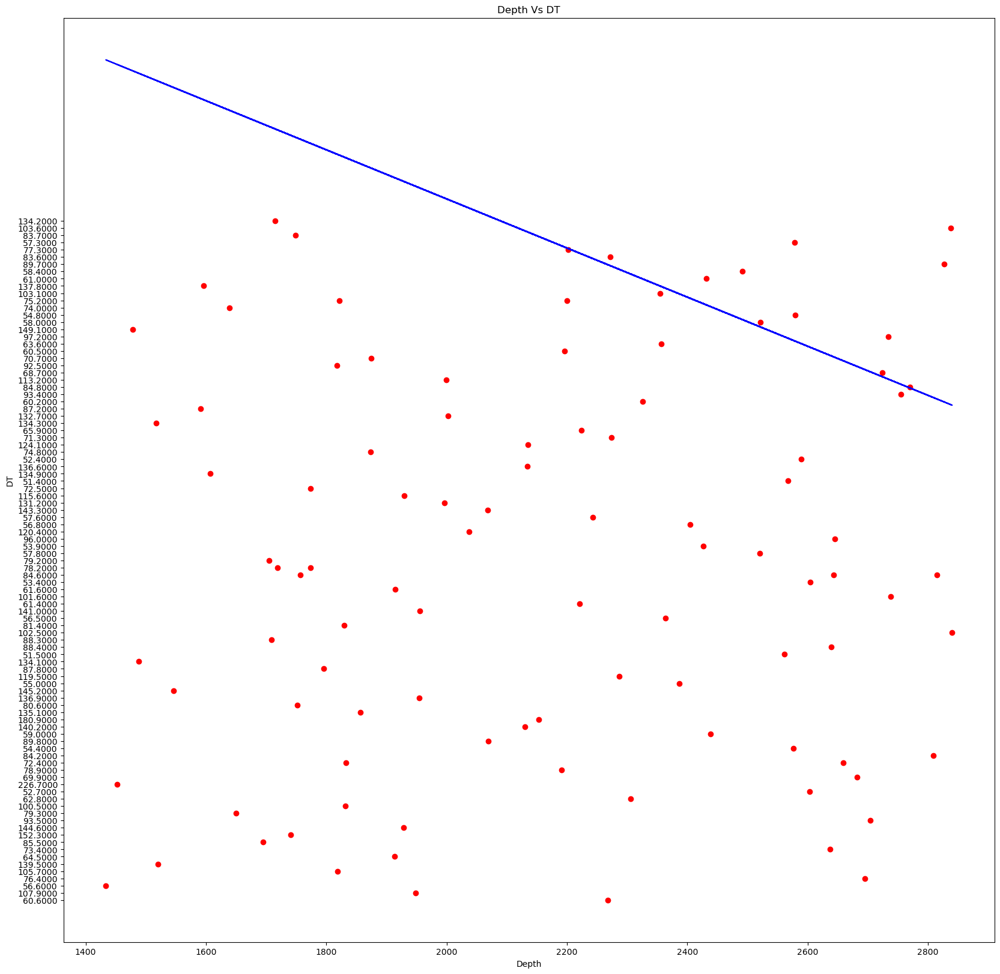

In [24]:
#7
import numpy as np
import matplotlib.pyplot as plt
x_test.astype(np.float64)
y_test.astype(np.float64)
X_test=X_test[:100]
y_test=y_test[:100]
#X_test=X_test.transpose()
plt.figure(figsize=(20,20))
plt.scatter(X_test,y_test,color='red')
plt.plot(X_test, regressor.predict(X_test), color='blue')
plt.title('Depth Vs DT')
plt.xlabel("Depth")
plt.ylabel("DT")
plt.show()


In [33]:
#idk 
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
files = ["well-1.LAS","well-2.LAS","well-3.LAS","well-4.LAS","well-5.LAS"]
Dict = {}
List = []
flag = 0
for filename in files:
    #Dict["well Number"] = {filename:[]}
    Dict[filename] = {}
    file = open(filename, 'r')
    for line in file.readlines():
        if("~A" in line and flag == 0):
            head = line.strip()
            head = head.replace("~A", "")
            head = head.split()
            flag = 1
            for i in range(1, len(head), 1):
                Dict[filename][head[i]]=[]
        elif(flag == 1):
            if("~" in line):
                flag = 0
            else:
                data = line.strip()
                data = data.split()
                if(len(head)>2):
                    for i in range(1, len(head), 1):
                        List = [data[0], data[i]]
                        Dict[filename][head[i]].append(List)
                else:
                    Dict[filename][head[1]].append(data)
                    
#print(Dict.keys())
#print(Dict) 

data = pd.DataFrame.from_dict(Dict)

for column in data.index.values:
    well_1_data = data.loc[column]['well-1.LAS']
    if type(well_1_data) is not list:
        well_1_data = []
    well_2_data = data.loc[column]['well-2.LAS']
    if type(well_2_data) is not list:
        well_2_data = []
    well_3_data = data.loc[column]['well-3.LAS']
    if type(well_3_data) is not list:
        well_3_data = []
    well_4_data = data.loc[column]['well-4.LAS']
    if type(well_4_data) is not list:
        well_4_data = []
    well_5_data = data.loc[column]['well-5.LAS']
    if type(well_5_data) is not list:
        well_5_data = []
    column_data = well_1_data + well_2_data + well_3_data + well_4_data + well_5_data
    column_data = np.array(column_data).astype(float)

    X = column_data[:, 0].reshape(-1, 1)
    Y = column_data[:, 1]

    model = LinearRegression()
    model.fit(X, Y)
    print(f"Predicting for depth {(X[-1] + 1)[0]}")
    print(f"{column} = {model.predict((X[-1] + 1).reshape(-1, 1))[0]}")
    print(f"RMSE = {mean_squared_error(Y, model.predict(X), squared=False)}")
    print("\n")

Predicting for depth 2972.4081
DT = 374.91740837560826
RMSE = 260.1741238803482


Predicting for depth 2972.4081
GR = 24.721361342040336
RMSE = 205.52565912640657


Predicting for depth 2972.4081
IMPEDANCE = 13731.504556243377
RMSE = 3143.9997749259965


Predicting for depth 2965.0276
LLD = 69.16324296735532
RMSE = 562.31149517427


Predicting for depth 2969.2949
NPHI = -172.63423489105546
RMSE = 381.51372403124486


Predicting for depth 2969.2949
RHOB = -13.357729058180908
RMSE = 179.4368688490403


Predicting for depth 2965.1292
MSFL = -29.07545279652652
RMSE = 228.84757060178168


Predicting for depth 2972.4081
LITHOLOGY = -56.409999624572265
RMSE = 375.1602926396117


Predicting for depth 2965.0276
LLS = 20.616608319522953
RMSE = 123.6188123477305


Predicting for depth 2658.2461
CALS = 15.065576291646465
RMSE = 3.0620923323101135


Predicting for depth 2969.1421
CGR = -42.70360537455281
RMSE = 396.0541056271175


Predicting for depth 2658.2461
SGR = 42.49358312825109
RMSE = 14.722

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
files=["well-1.LAS","well-2.LAS","well-3.LAS","well-4.LAS","well-5.LAS"]
dict={}
dd=[]
flg=0
for filename in files:
    #dict["WELL No"]={filename:[]}
    dict[filename]={}
    file=open(filename, 'r') 
    for line in file.readlines(): 
        if("~A" in line and flg==0): 
            head=line.strip() 
            head=head.replace("~A","") 
            head=head.split() 
            flg=1         
            for a in range(1,len(head),1): 
                dict[filename][head[a]]=[]           
        elif(flg==1): 
            if("~" in line):
                flg=0 
            else: 
                data=line.strip() 
                data=data.split()             
                if(len(head)>2):
                    for a in range(1,len(head),1): 
                        dd=[data[0], data[a]]                        
                        dict[filename][head[a]].append(dd)           
                else:
                    dict[filename][head[1]].append(data)
            
print(dict["well-5.LAS"].keys())   
df = pd.DataFrame(dict["well-1.LAS"]["DT"], columns=["DEPTH","DT"])
#print(df)
print(df.shape)
X=df.iloc[:,:-1].values
y=df.iloc[:, -1].values
print(type(X))
print(X.shape)
X=X.astype(np.float)
#print(X)
from sklearn.model_selection import train_test_split
X_train, X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=0)
from sklearn.linear_model import LinearRegression
regressor=LinearRegression()
regressor.fit(X_train,y_train)
y_pred=regressor.predict([[2000.156]])
print(y_pred)
X_test=X_test[:100]
y_test=y_test[:100]
#X_test=X_test.transpose()
plt.figure(figsize=(20,20))
plt.scatter(X_test,y_test,color='red')
plt.plot(X_test, regressor.predict(X_test), color='blue')
plt.title('Depth Vs DT')
plt.xlabel("Depth")
plt.ylabel("DT")
plt.show()

X_train=X_train[:100]
y_train=y_train[:100]
#X_test=X_test.transpose()
plt.figure(figsize=(20,20))
plt.scatter(X_train,y_train,color='black')
plt.plot(X_train, regressor.predict(X_train), color='green')
plt.title('Depth Vs DT')
plt.xlabel("Depth")
plt.ylabel("DT")
plt.show()


dict_keys(['CGR', 'DT', 'GR', 'LLD', 'LLS', 'MSFL', 'NPHI', 'IMPEDANCE', 'RHOB', 'CALI', 'LITHOLOGY', 'RHOB_ED', 'DTLF', 'DTLN'])
(9261, 2)
<class 'numpy.ndarray'>
(9261, 1)
[97.04034517]


C:\Users\aakan\AppData\Local\Temp\ipykernel_21048\2362263782.py:41: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X=X.astype(np.float)


ValueError: Found input variables with inconsistent numbers of samples: [7408, 1]

In [39]:
data = pd.DataFrame.from_dict(Dict)
for column in data.index.values:
    well_1_data = data.loc[column]['well-1.LAS']
    if type(well_1_data) is not list:
        well_1_data = []
    well_2_data = data.loc[column]['well-2.LAS']
    if type(well_2_data) is not list:
        well_2_data = []
    well_3_data = data.loc[column]['well-3.LAS']
    if type(well_3_data) is not list:
        well_3_data = []
    well_4_data = data.loc[column]['well-4.LAS']
    if type(well_4_data) is not list:
        well_4_data = []
    well_5_data = data.loc[column]['well-5.LAS']
    if type(well_5_data) is not list:
        well_5_data = []
    column_data = well_1_data + well_2_data + well_3_data + well_4_data + well_5_data
    column_data = np.array(column_data).astype(float)

    X = column_data[:, 0].reshape(-1, 1)
    Y = column_data[:, 1]

    model = LinearRegression()
    model.fit(X, Y)
    print(f"Predicting for depth {(X[-1] + 1)[0]}")
    print(f"{column} = {model.predict((X[-1] + 1).reshape(-1, 1))[0]}")
    rmse = mean_squared_error(Y, model.predict(X), squared=False)
    print(f"RMSE = {rmse}")
    std = np.std(Y)
    print(f"STD = {std}")
    rmse_norm = rmse/std
    print(f"RMSE normalized = {rmse_norm}")
    print("\n")
    

Predicting for depth 2972.4081
DT = 374.91740837560826
RMSE = 260.1741238803482
STD = 365.30957547629407
RMSE normalized = 0.7122017635073778


Predicting for depth 2972.4081
GR = 24.721361342040336
RMSE = 205.52565912640657
STD = 205.95500546696988
RMSE normalized = 0.9979153391315261


Predicting for depth 2972.4081
IMPEDANCE = 13731.504556243377
RMSE = 3143.9997749259965
STD = 5519.5267392810165
RMSE normalized = 0.5696140128375462


Predicting for depth 2965.0276
LLD = 69.16324296735532
RMSE = 562.31149517427
STD = 564.2297659287212
RMSE normalized = 0.9966001957530657


Predicting for depth 2969.2949
NPHI = -172.63423489105546
RMSE = 381.51372403124486
STD = 381.51683829892767
RMSE normalized = 0.9999918371422434


Predicting for depth 2969.2949
RHOB = -13.357729058180908
RMSE = 179.4368688490403
STD = 179.65986955485056
RMSE normalized = 0.9987587617292455


Predicting for depth 2965.1292
MSFL = -29.07545279652652
RMSE = 228.84757060178168
STD = 230.63514765085574
RMSE normalized